<a href="https://colab.research.google.com/github/wenchun0731/github-colab/blob/main/crosswalk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
image=cv2.imread('/content/frame_2135.jpg')
image2=image.copy()


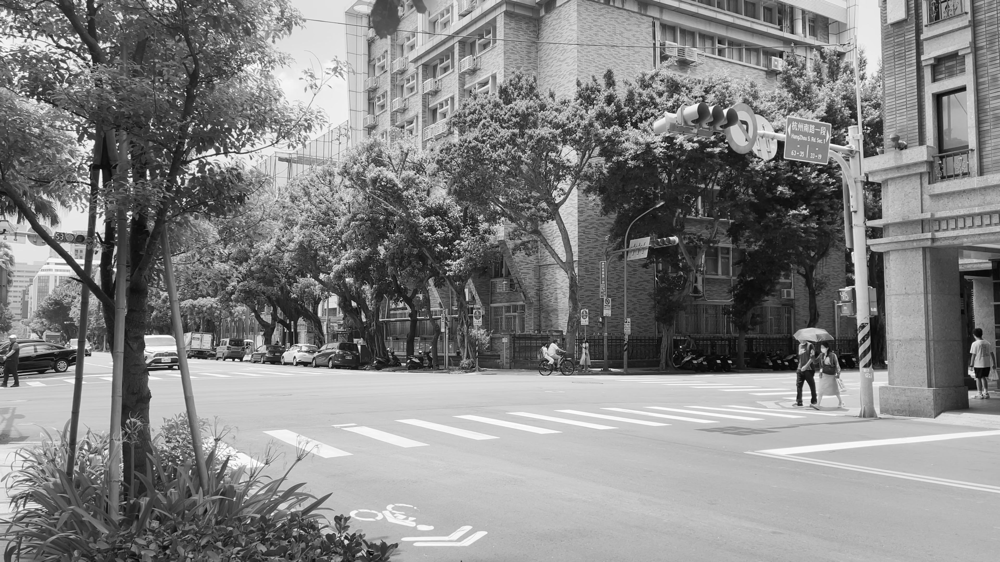

In [ ]:
gray_img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
from google.colab.patches import cv2_imshow
cv2_imshow(gray_img)


In [ ]:
# 使用 Canny 邊緣檢測
edges = cv2.Canny(gray_img, 50, 150)
cv2_imshow(edges)

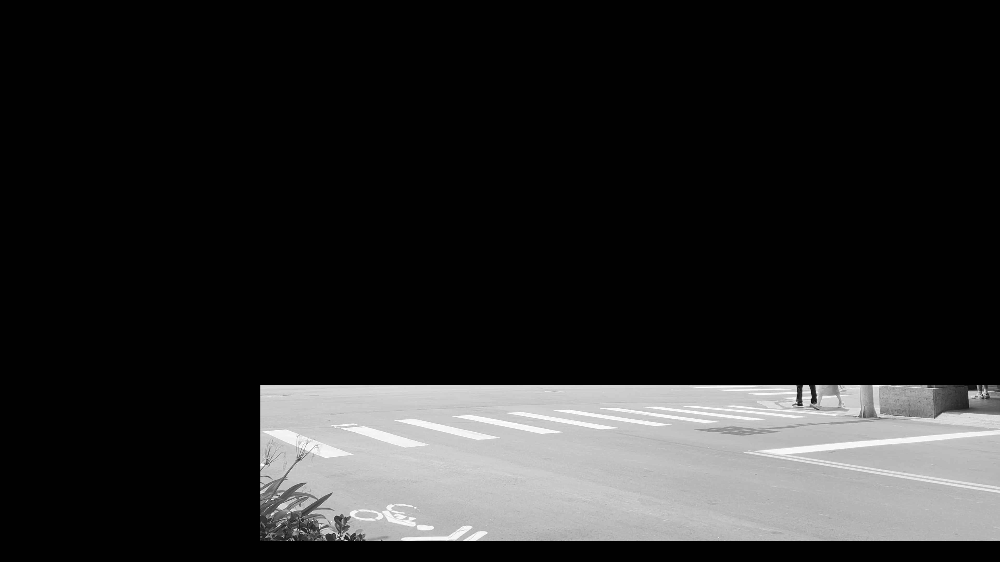

In [ ]:
import numpy as np

mask=np.ones_like(gray_img)*0
h,w=mask.shape[0:]
# print(h,w)
mask[h//2+400:h//2+1000,1000:1000+3000]=255
mask_edges=cv2.bitwise_and(gray_img,mask)
cv2_imshow(mask_edges)


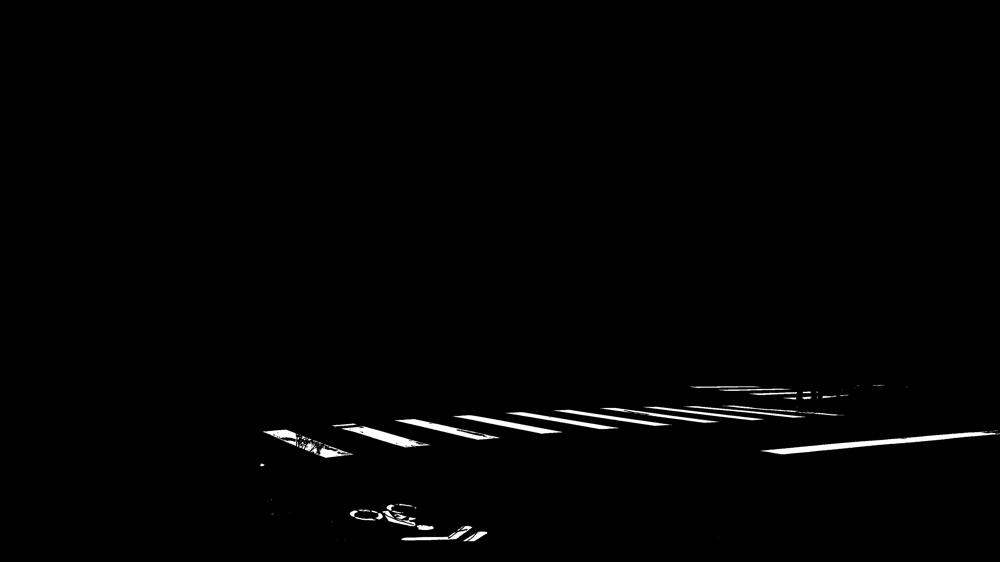

In [ ]:
threshold_value = 240  # 可以根據需要調整
max_value = 255
_, binary_image = cv2.threshold(mask_edges, threshold_value, max_value, cv2.THRESH_BINARY)
cv2_imshow(binary_image)

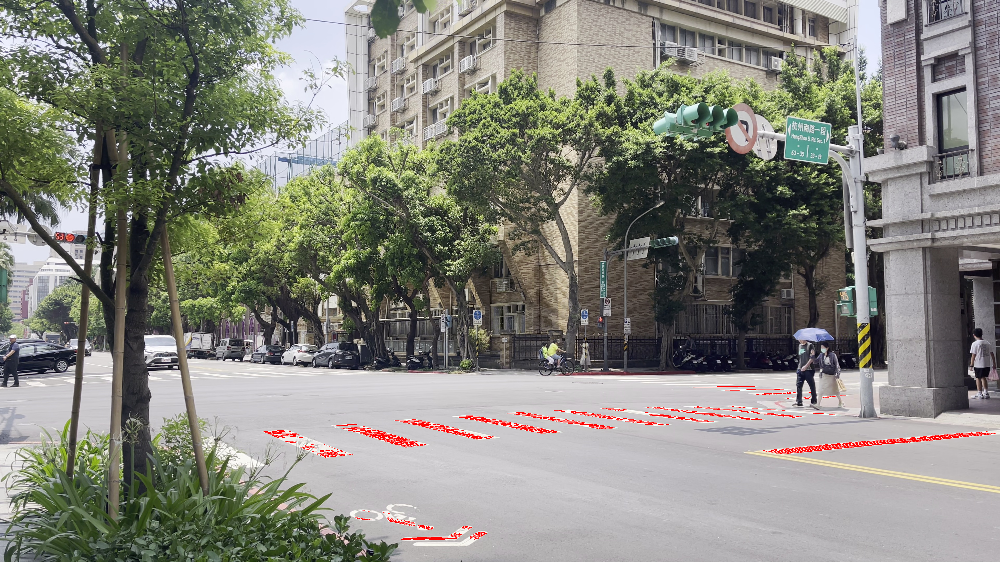

In [ ]:
import numpy as np
image=image2.copy()
# 使用 Hough 變換來檢測直線
#直線距離精度,角度精度,閾值參數,最小線段長度,兩個點之間的最大允許間隙
lines = cv2.HoughLinesP(binary_image, 1, np.pi / 180, 120, minLineLength=25, maxLineGap=5)
# 在原圖像上畫出檢測到的直線
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 1)
cv2_imshow(image)
